# Load the data

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [41]:
import numpy as np


# Load the data using np.load
data = np.load('/content/drive/MyDrive/projecttt/training_images_full.npz', allow_pickle=True)

# Extract the images
images = data['images']
# and the data points
pts = data['points']

print(images.shape, pts.shape)

# Load the data that only has a subset of annotations using np.load
data = np.load('/content/drive/MyDrive/projecttt/training_images_subset.npz', allow_pickle=True)

# Extract the images
images_subset = data['images']
# and the data points
pts_subset = data['points']

print(images_subset.shape, pts_subset.shape)

test_data = np.load('/content/drive/MyDrive/projecttt/test_images.npz', allow_pickle=True)
test_images = test_data['images']
print(test_images.shape)

example_data = np.load('/content/drive/MyDrive/projecttt/examples.npz', allow_pickle=True)
example_images = example_data['images']
print(example_images.shape)

(1425, 256, 256, 3) (1425, 44, 2)
(1386, 256, 256, 3) (1386, 5, 2)
(554, 256, 256, 3)
(6, 256, 256, 3)


# **Data Visualisation**

Here's an example of how to display the images and their points

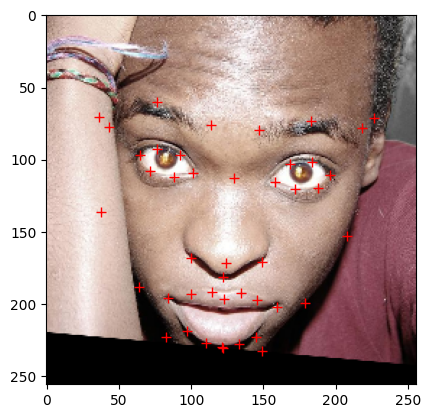

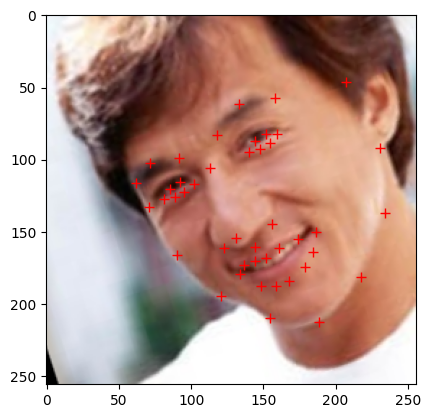

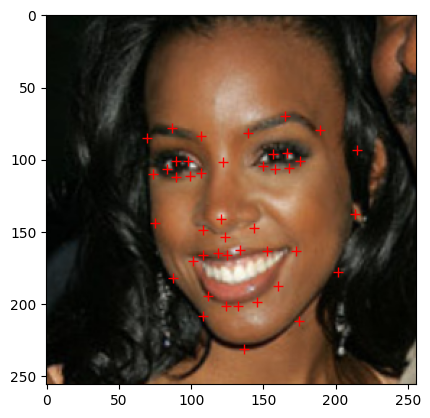

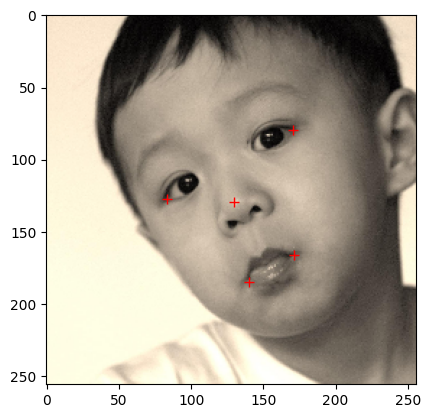

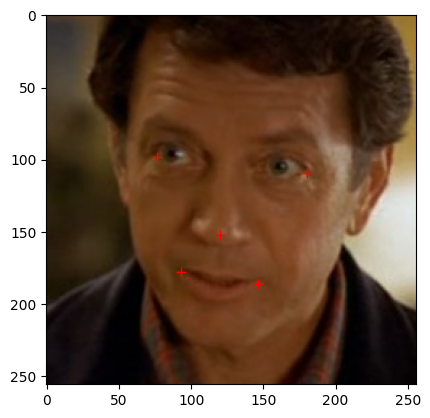

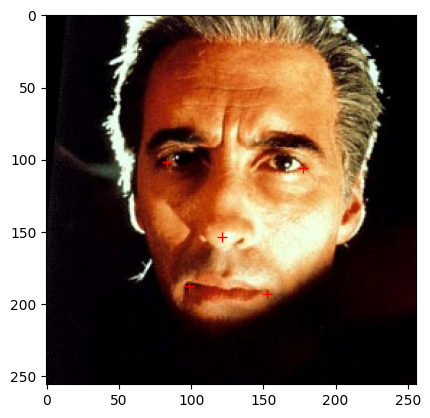

In [42]:
def visualise_pts(img, pts):
  import matplotlib.pyplot as plt
  plt.imshow(img)
  plt.plot(pts[:, 0], pts[:, 1], '+r', ms=7)
  plt.show()

for i in range(3):
  idx = np.random.randint(0, images.shape[0])
  visualise_pts(images[idx, ...], pts[idx, ...])

for i in range(3):
  idx = np.random.randint(0, images.shape[0])
  visualise_pts(images_subset[idx, ...], pts_subset[idx, ...])

# Extracting Subset of Points from Full Set. Calculating Prediction Error. and Exporting Results

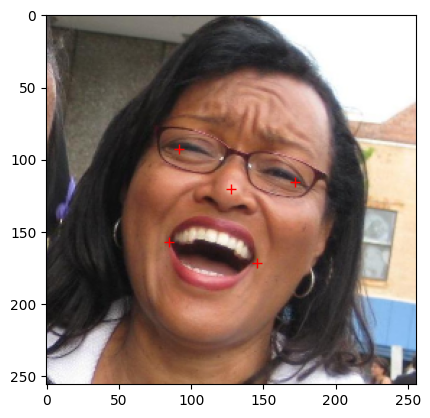

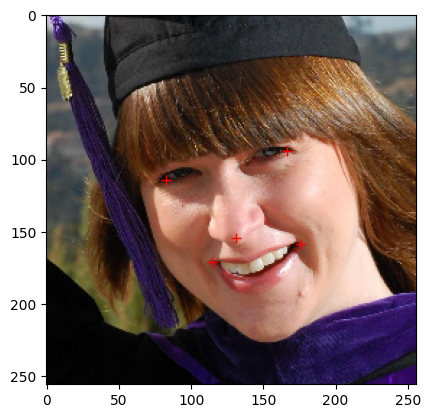

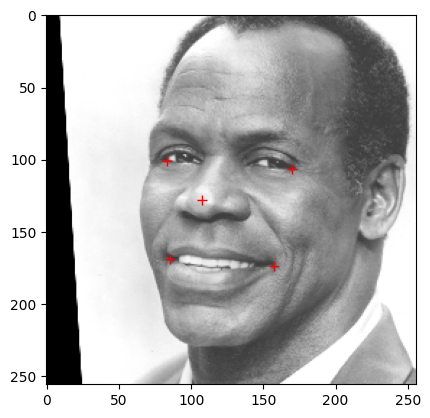

In [ ]:
def extract_subset_of_points(pts):
  indices = (20, 29, 16, 32, 38)
  if len(pts.shape) == 3:
    return pts[:, indices, :]
  elif len(pts.shape) == 2:
    return pts[indices, :]


for i in range(3):
  idx = np.random.randint(0, images.shape[0])
  visualise_pts(images[idx, ...], extract_subset_of_points(pts[idx, ...]))

# Apply Models and training with Full Dataset & Subset Dataset

#Tradional CNN Used:

##Full Dataset

In [46]:
from google.colab import drive
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split

# Mount Google Drive
drive.mount('/content/drive')

# Load the data using np.load
data = np.load('/content/drive/MyDrive/projecttt/training_images_full.npz', allow_pickle=True)

# Extract the images and data points
images = data['images']
pts = data['points']

# Load the data that only has a subset of annotations using np.load
data = np.load('/content/drive/MyDrive/projecttt/training_images_subset.npz', allow_pickle=True)

# Extract the images and data points
images_subset = data['images']
pts_subset = data['points']

# Load test images
test_data = np.load('/content/drive/MyDrive/projecttt/test_images.npz', allow_pickle=True)
test_images = test_data['images']

# Load example images
example_data = np.load('/content/drive/MyDrive/projecttt/examples.npz', allow_pickle=True)
example_images = example_data['images']

# Normalize the images
images = images.astype('float32') / 255.0
images_subset = images_subset.astype('float32') / 255.0
test_images = test_images.astype('float32') / 255.0
example_images = example_images.astype('float32') / 255.0

# Flatten the points
pts = pts.reshape(pts.shape[0], -1)
pts_subset = pts_subset.reshape(pts_subset.shape[0], -1)

# Split the data into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(images, pts, test_size=0.1, random_state=42)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Define CNN Model

In [38]:
def create_model():
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(256, 256, 3)),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        MaxPooling2D((2, 2)),
        Conv2D(128, (3, 3), activation='relu', padding='same'),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(512, activation='relu'),
        Dropout(0.5),
        Dense(88)  # Number of output values (44 points * 2 dimensions)
    ])

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['mae'])
    return model

model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 64, 64, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 32, 32, 128)      0

### **Train the model**

In [39]:
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val))

Epoch 1/100
41/41 [==============================] - 11s 98ms/step - loss: 4379.7603 - mae: 51.1263 - val_loss: 553.5505 - val_mae: 18.3811
Epoch 2/100
41/41 [==============================] - 3s 79ms/step - loss: 1077.3667 - mae: 26.1020 - val_loss: 272.2235 - val_mae: 12.7290
Epoch 3/100
41/41 [==============================] - 4s 97ms/step - loss: 718.7988 - mae: 21.2658 - val_loss: 343.0417 - val_mae: 14.9718
Epoch 4/100
41/41 [==============================] - 3s 82ms/step - loss: 600.6776 - mae: 19.4367 - val_loss: 171.7820 - val_mae: 9.6751
Epoch 5/100
41/41 [==============================] - 3s 76ms/step - loss: 541.6479 - mae: 18.4228 - val_loss: 265.4820 - val_mae: 12.7884
Epoch 6/100
41/41 [==============================] - 3s 77ms/step - loss: 452.5536 - mae: 16.7525 - val_loss: 199.9234 - val_mae: 10.8619
Epoch 7/100
41/41 [==============================] - 3s 81ms/step - loss: 427.9451 - mae: 16.3260 - val_loss: 361.6400 - val_mae: 15.8691
Epoch 8/100
41/41 [=============

**Testing on Example Dataset**

1/1 [==============================] - 0s 23ms/step


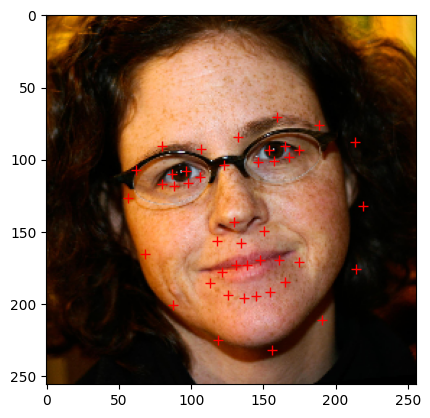

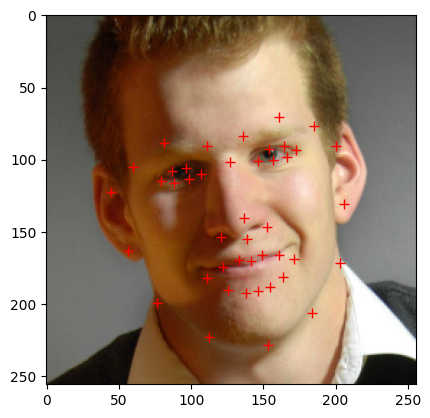

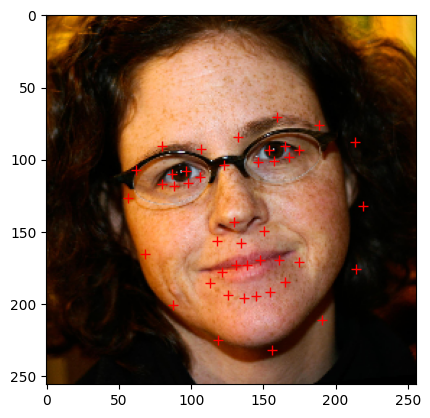

In [50]:
example_pts = model.predict(example_images)
example_pts = example_pts.reshape(example_pts.shape[0], -1, 2)

# Visualize the results
for i in range(3):
    idx = np.random.randint(0,6)
    visualise_pts(example_images[idx, ...], example_pts[idx, ...])

In [ ]:
from sklearn.metrics import mean_squared_error

test_pts = model.predict(X_val)
mse = mean_squared_error(y_val, test_pts)
print("Mean squared error:", mse)

5/5 [==============================] - 0s 30ms/step
Mean squared error: 60.10605996470388


### **Test the model using the test_images:**

18/18 [==============================] - 1s 40ms/step


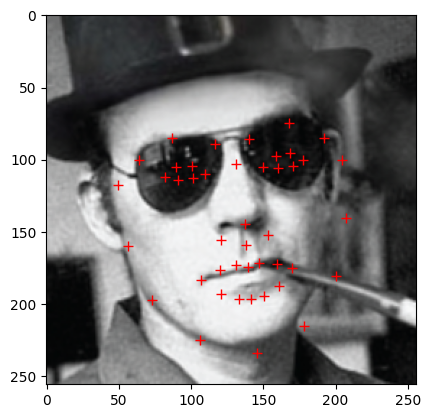

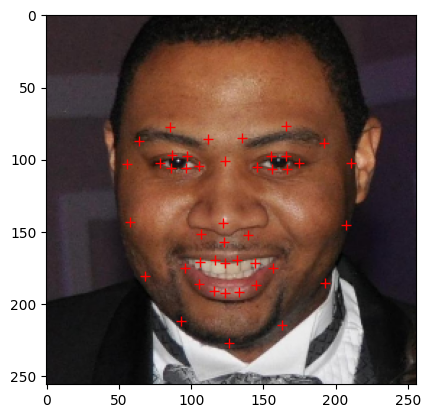

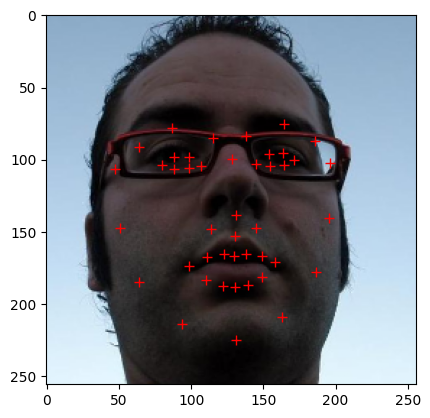

In [ ]:
test_pts = model.predict(test_images)
test_pts = test_pts.reshape(test_pts.shape[0], -1, 2)

# Visualize the results
for i in range(3):
    idx = np.random.randint(0, test_images.shape[0])
    visualise_pts(test_images[idx, ...], test_pts[idx, ...])

##Subset Dataset

In [1]:
from google.colab import drive
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split

# Mount Google Drive
drive.mount('/content/drive')

# Load the data using np.load
data = np.load('/content/drive/MyDrive/projecttt/training_images_full.npz', allow_pickle=True)

# Extract the images and data points
images = data['images']
pts = data['points']

# Load the data that only has a subset of annotations using np.load
data = np.load('/content/drive/MyDrive/projecttt/training_images_subset.npz', allow_pickle=True)

# Extract the images and data points
images_subset = data['images']
pts_subset = data['points']

# Load test images
test_data = np.load('/content/drive/MyDrive/projecttt/test_images.npz', allow_pickle=True)
test_images = test_data['images']

# Load example images
example_data = np.load('/content/drive/MyDrive/projecttt/examples.npz', allow_pickle=True)
example_images = example_data['images']

# Normalize the images
images = images.astype('float32') / 255.0
images_subset = images_subset.astype('float32') / 255.0
test_images = test_images.astype('float32') / 255.0
example_images = example_images.astype('float32') / 255.0

# Flatten the points
pts = pts.reshape(pts.shape[0], -1)
pts_subset = pts_subset.reshape(pts_subset.shape[0], -1)

# Split the data into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(images_subset, pts_subset, test_size=0.1, random_state=42)

Mounted at /content/drive


In [2]:
def create_model():
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(256, 256, 3)),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        MaxPooling2D((2, 2)),
        Conv2D(128, (3, 3), activation='relu', padding='same'),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(512, activation='relu'),
        Dropout(0.5),
        Dense(10)  # Number of output values (44 points * 2 dimensions)
    ])

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['mae'])
    return model

model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 64, 64, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 32, 32, 128)      0

In [3]:
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val))

Epoch 1/100
39/39 [==============================] - 19s 143ms/step - loss: 2708.3181 - mae: 38.8181 - val_loss: 432.6840 - val_mae: 16.1807
Epoch 2/100
39/39 [==============================] - 3s 77ms/step - loss: 830.9496 - mae: 22.9244 - val_loss: 157.2730 - val_mae: 9.7950
Epoch 3/100
39/39 [==============================] - 3s 78ms/step - loss: 530.5018 - mae: 18.2955 - val_loss: 120.7009 - val_mae: 8.5438
Epoch 4/100
39/39 [==============================] - 3s 77ms/step - loss: 437.8452 - mae: 16.6116 - val_loss: 126.4847 - val_mae: 8.8645
Epoch 5/100
39/39 [==============================] - 3s 80ms/step - loss: 418.9119 - mae: 16.2542 - val_loss: 99.0310 - val_mae: 7.6866
Epoch 6/100
39/39 [==============================] - 3s 80ms/step - loss: 352.6792 - mae: 14.8263 - val_loss: 90.7525 - val_mae: 7.2419
Epoch 7/100
39/39 [==============================] - 3s 78ms/step - loss: 337.3280 - mae: 14.5709 - val_loss: 88.5791 - val_mae: 7.2039
Epoch 8/100
39/39 [=====================

In [4]:
def visualise_pts(img, pts):
  import matplotlib.pyplot as plt
  plt.imshow(img)
  plt.plot(pts[:, 0], pts[:, 1], '+r', ms=7)
  plt.show()

## **Testing on Example Dataset**

1/1 [==============================] - 0s 34ms/step


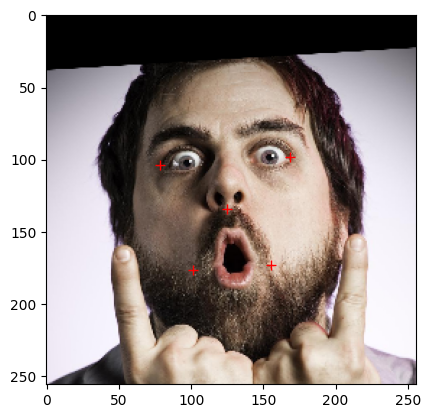

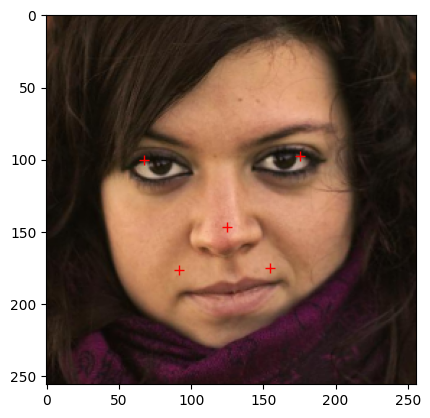

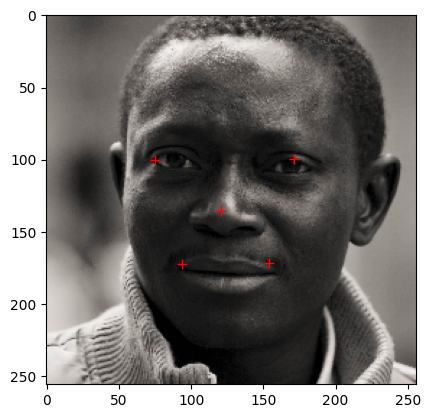

In [8]:
example_pts = model.predict(example_images)
example_pts = example_pts.reshape(example_pts.shape[0], -1, 2)

# Visualize the results
for i in range(3):
    idx = np.random.randint(0, example_images.shape[0])
    visualise_pts(example_images[idx, ...], example_pts[idx, ...])

In [ ]:
from sklearn.metrics import mean_squared_error

test_pts = model.predict(X_val)
mse = mean_squared_error(y_val, test_pts)
print("Mean squared error:", mse)

5/5 [==============================] - 0s 18ms/step
Mean squared error: 47.20831448860481


18/18 [==============================] - 1s 26ms/step


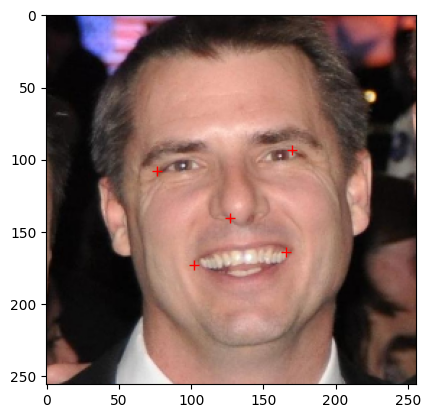

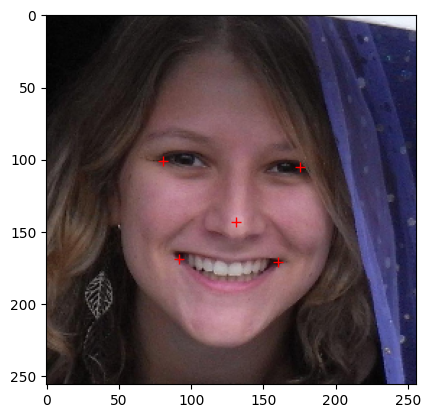

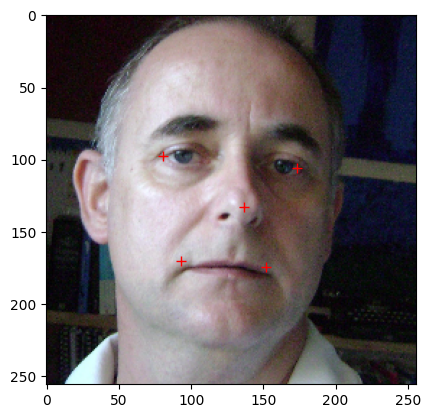

In [ ]:
test_pts = model.predict(test_images)
test_pts = test_pts.reshape(test_pts.shape[0], -1, 2)

# Visualize the results
for i in range(3):
    idx = np.random.randint(0, test_images.shape[0])
    visualise_pts(test_images[idx, ...], test_pts[idx, ...])

# **Applying advanced CNN Using data augmentation and learning rate scheduling**

##Full Dataset

In [9]:
from google.colab import drive
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split

# Mount Google Drive
drive.mount('/content/drive')

# Load the data using np.load
data = np.load('/content/drive/MyDrive/projecttt/training_images_full.npz', allow_pickle=True)

# Extract the images and data points
images = data['images']
pts = data['points']

# Load the data that only has a subset of annotations using np.load
data = np.load('/content/drive/MyDrive/projecttt/training_images_subset.npz', allow_pickle=True)

# Extract the images and data points
images_subset = data['images']
pts_subset = data['points']

# Load test images
test_data = np.load('/content/drive/MyDrive/projecttt/test_images.npz', allow_pickle=True)
test_images = test_data['images']

# Load example images
example_data = np.load('/content/drive/MyDrive/projecttt/examples.npz', allow_pickle=True)
example_images = example_data['images']

# Normalize the images
images = images.astype('float32') / 255.0
images_subset = images_subset.astype('float32') / 255.0
test_images = test_images.astype('float32') / 255.0
example_images = example_images.astype('float32') / 255.0

# Flatten the points
pts = pts.reshape(pts.shape[0], -1)
pts_subset = pts_subset.reshape(pts_subset.shape[0], -1)

# Split the data into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(images, pts, test_size=0.1, random_state=42)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [10]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define data augmentation
data_gen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1
)
data_gen.fit(X_train)

# Define the advanced CNN model
def create_advanced_model():
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(256, 256, 3)),
        BatchNormalization(),
        Conv2D(32, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),
        Dropout(0.3),

        Conv2D(64, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),
        Dropout(0.5),

        Conv2D(128, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        Conv2D(128, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),
        Dropout(0.5),

        Flatten(),
        Dense(512, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),
        Dense(88)  # Number of output values (44 points * 2 dimensions)
    ])

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['mae'])
    return model

model = create_advanced_model()
model.summary()

# Define learning rate scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6, verbose=1)

# Define early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 256, 256, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 256, 256, 32)     128       
 ormalization)                                                   
                                                                 
 conv2d_4 (Conv2D)           (None, 256, 256, 32)      9248      
                                                                 
 batch_normalization_1 (Batc  (None, 256, 256, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 128, 128, 32)     0         
 2D)                                                             
                                                      

In [11]:
# Train the model with data augmentation and learning rate scheduler
history = model.fit(data_gen.flow(X_train, y_train, batch_size=32),
                    epochs=100,
                    validation_data=(X_val, y_val),
                    callbacks=[lr_scheduler, early_stopping])

Epoch 1/100
41/41 [==============================] - 36s 644ms/step - loss: 19815.3359 - mae: 134.0754 - val_loss: 19742.7520 - val_mae: 133.7284 - lr: 0.0010
Epoch 2/100
41/41 [==============================] - 26s 604ms/step - loss: 19624.7734 - mae: 133.3667 - val_loss: 19772.5176 - val_mae: 133.7467 - lr: 0.0010
Epoch 3/100
41/41 [==============================] - 22s 523ms/step - loss: 19116.8750 - mae: 131.4574 - val_loss: 18755.6387 - val_mae: 129.9893 - lr: 0.0010
Epoch 4/100
41/41 [==============================] - 23s 557ms/step - loss: 18063.6660 - mae: 127.4048 - val_loss: 17376.8086 - val_mae: 124.6541 - lr: 0.0010
Epoch 5/100
41/41 [==============================] - 22s 533ms/step - loss: 16292.5908 - mae: 120.2755 - val_loss: 14593.0205 - val_mae: 113.0232 - lr: 0.0010
Epoch 6/100
41/41 [==============================] - 24s 573ms/step - loss: 13812.0947 - mae: 109.5574 - val_loss: 12722.0547 - val_mae: 104.6003 - lr: 0.0010
Epoch 7/100
41/41 [===========================

In [12]:
def visualise_pts(img, pts):
  import matplotlib.pyplot as plt
  plt.imshow(img)
  plt.plot(pts[:, 0], pts[:, 1], '+r', ms=7)
  plt.show()

## **Testing on Example Dataset**

1/1 [==============================] - 1s 507ms/step


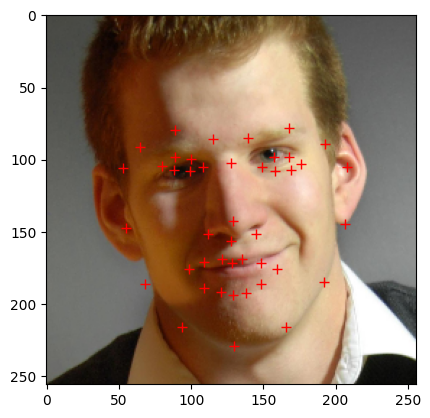

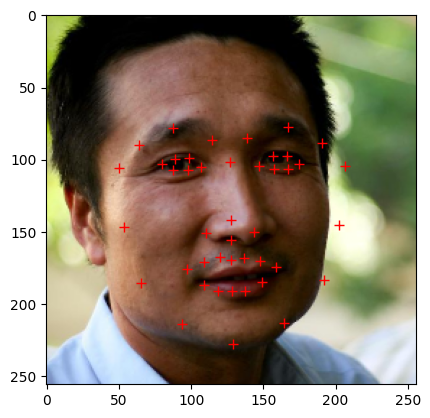

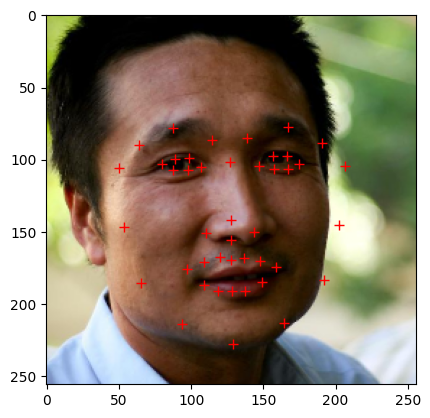

In [13]:
example_pts = model.predict(example_images)
example_pts = example_pts.reshape(example_pts.shape[0], -1, 2)

# Visualize the results
for i in range(3):
    idx = np.random.randint(0, example_images.shape[0])
    visualise_pts(example_images[idx, ...], example_pts[idx, ...])

18/18 [==============================] - 1s 51ms/step


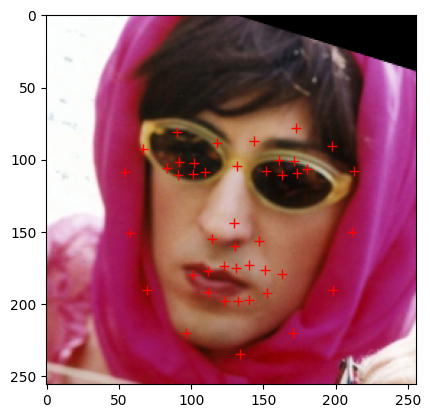

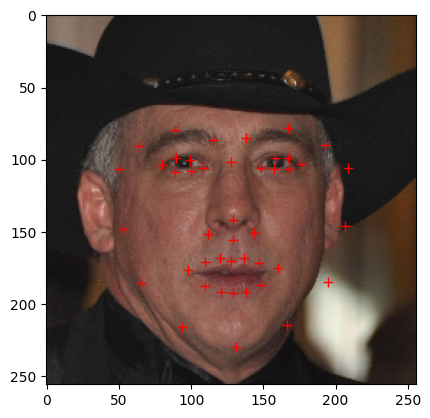

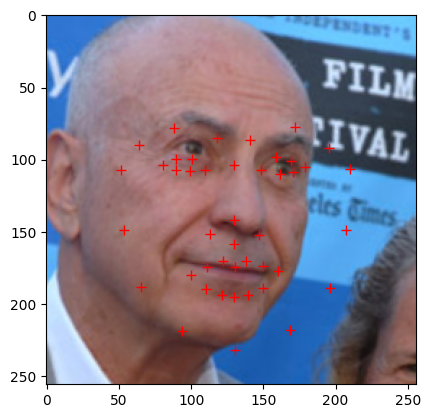

In [ ]:
predicted_points = model.predict(test_images)
predicted_points = predicted_points.reshape(predicted_points.shape[0], -1, 2)

# Visualize the results on a few test images
for i in range(3):
    idx = np.random.randint(0, test_images.shape[0])
    visualise_pts(test_images[idx, ...], predicted_points[idx, ...])

##Subset Dataset

In [18]:
from google.colab import drive
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split

# Mount Google Drive
drive.mount('/content/drive')

# Load the data using np.load
data = np.load('/content/drive/MyDrive/projecttt/training_images_full.npz', allow_pickle=True)

# Extract the images and data points
images = data['images']
pts = data['points']

# Load the data that only has a subset of annotations using np.load
data = np.load('/content/drive/MyDrive/projecttt/training_images_subset.npz', allow_pickle=True)

# Extract the images and data points
images_subset = data['images']
pts_subset = data['points']

# Load test images
test_data = np.load('/content/drive/MyDrive/projecttt/test_images.npz', allow_pickle=True)
test_images = test_data['images']

# Load example images
example_data = np.load('/content/drive/MyDrive/projecttt/examples.npz', allow_pickle=True)
example_images = example_data['images']

# Normalize the images
images = images.astype('float32') / 255.0
images_subset = images_subset.astype('float32') / 255.0
test_images = test_images.astype('float32') / 255.0
example_images = example_images.astype('float32') / 255.0

# Flatten the points
pts = pts.reshape(pts.shape[0], -1)
pts_subset = pts_subset.reshape(pts_subset.shape[0], -1)

# Split the data into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(images_subset, pts_subset, test_size=0.1, random_state=42)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [16]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define data augmentation
data_gen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1
)
data_gen.fit(X_train)

# Define the advanced CNN model
def create_advanced_model():
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(256, 256, 3)),
        BatchNormalization(),
        Conv2D(32, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),
        Dropout(0.3),

        Conv2D(64, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),
        Dropout(0.5),

        Conv2D(128, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        Conv2D(128, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),
        Dropout(0.5),

        Flatten(),
        Dense(512, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),
        Dense(10)  # Number of output values (44 points * 2 dimensions)
    ])

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['mae'])
    return model

model = create_advanced_model()
model.summary()

# Define learning rate scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6, verbose=1)

# Define early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 256, 256, 32)      896       
                                                                 
 batch_normalization_7 (Batc  (None, 256, 256, 32)     128       
 hNormalization)                                                 
                                                                 
 conv2d_10 (Conv2D)          (None, 256, 256, 32)      9248      
                                                                 
 batch_normalization_8 (Batc  (None, 256, 256, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 128, 128, 32)     0         
 2D)                                                             
                                                      

In [19]:
# Train the model with data augmentation and learning rate scheduler
history = model.fit(data_gen.flow(X_train, y_train, batch_size=32),
                    epochs=100,
                    validation_data=(X_val, y_val),
                    callbacks=[lr_scheduler, early_stopping])

Epoch 1/100
39/39 [==============================] - 33s 741ms/step - loss: 19422.4238 - mae: 134.5256 - val_loss: 19080.3086 - val_mae: 133.5529 - lr: 0.0010
Epoch 2/100
39/39 [==============================] - 24s 621ms/step - loss: 19183.8789 - mae: 133.6506 - val_loss: 18467.2695 - val_mae: 131.1277 - lr: 0.0010
Epoch 3/100
39/39 [==============================] - 23s 592ms/step - loss: 18638.6133 - mae: 131.6275 - val_loss: 18169.5703 - val_mae: 129.9273 - lr: 0.0010
Epoch 4/100
39/39 [==============================] - 24s 609ms/step - loss: 17609.7441 - mae: 127.6766 - val_loss: 16643.3438 - val_mae: 124.3421 - lr: 0.0010
Epoch 5/100
39/39 [==============================] - 24s 617ms/step - loss: 15972.2324 - mae: 121.1024 - val_loss: 14184.9316 - val_mae: 113.8923 - lr: 0.0010
Epoch 6/100
39/39 [==============================] - 25s 626ms/step - loss: 13650.6436 - mae: 111.1551 - val_loss: 12322.3721 - val_mae: 105.2024 - lr: 0.0010
Epoch 7/100
39/39 [===========================

In [20]:
def visualise_pts(img, pts):
  import matplotlib.pyplot as plt
  plt.imshow(img)
  plt.plot(pts[:, 0], pts[:, 1], '+r', ms=7)
  plt.show()

1/1 [==============================] - 1s 757ms/step


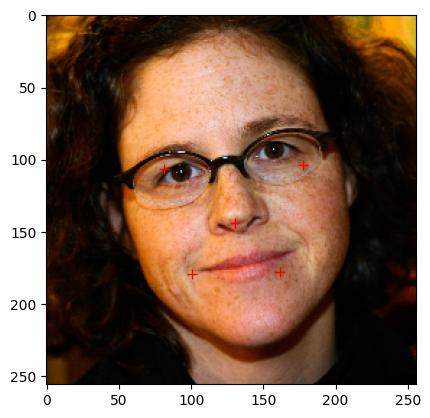

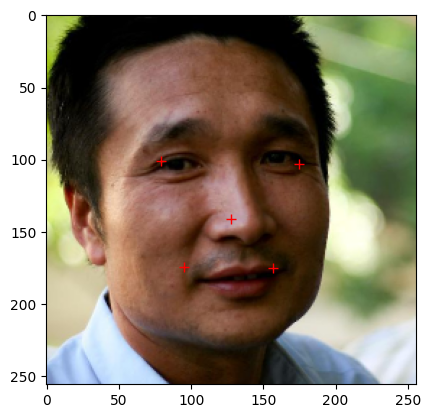

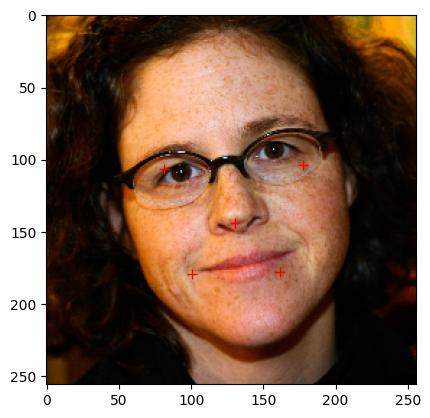

In [21]:
example_pts = model.predict(example_images)
example_pts = example_pts.reshape(example_pts.shape[0], -1, 2)

# Visualize the results
for i in range(3):
    idx = np.random.randint(0, example_images.shape[0])
    visualise_pts(example_images[idx, ...], example_pts[idx, ...])

In [ ]:
from sklearn.metrics import mean_squared_error

test_pts = model.predict(X_val)
mse = mean_squared_error(y_val, test_pts)
print("Mean squared error:", mse)

5/5 [==============================] - 0s 46ms/step
Mean squared error: 95.92100643927795


18/18 [==============================] - 1s 52ms/step


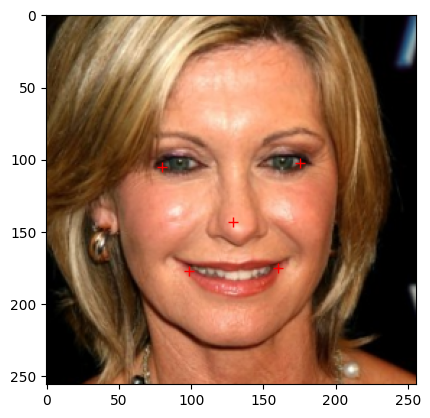

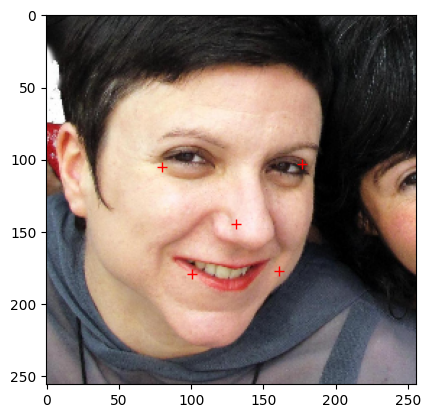

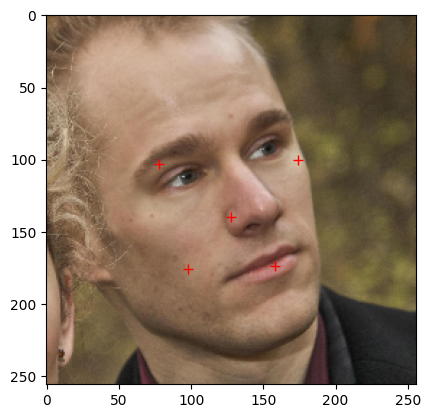

In [ ]:
predicted_points = model.predict(test_images)
predicted_points = predicted_points.reshape(predicted_points.shape[0], -1, 2)

# Visualize the results on a few test images
for i in range(3):
    idx = np.random.randint(0, test_images.shape[0])
    visualise_pts(test_images[idx, ...], predicted_points[idx, ...])

# **OpenCV**

In [ ]:
import cv2
import numpy as np
import random
from google.colab.patches import cv2_imshow

def detect_faces(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
    return faces

def preprocess_faces(image, faces, target_size=(256, 256)):
    cropped_faces = []
    for (x, y, w, h) in faces:
        face = image[y:y+h, x:x+w]
        resized_face = cv2.resize(face, target_size)
        cropped_faces.append(resized_face)
    return cropped_faces

def visualise_pts(img, pts):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for point in pts:
        x, y = int(point[0]), int(point[1])
        cv2.circle(img, (x, y), 6, (0, 0, 255), 3)
    return img

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Load test images
test_data = np.load('/content/drive/MyDrive/pythonproject/test_images.npz', allow_pickle=True)
test_images = test_data['images']
test_images = test_images.astype('float32') / 255.0

# Detect faces and plot points on 3 random test images
random_indices = random.sample(range(len(test_images)), 3)
for i in random_indices:
    image = test_images[i]
    image = (image * 255).astype(np.uint8)
    faces = detect_faces(image)

    cropped_faces = preprocess_faces(image, faces)

    for face in cropped_faces:
        face_normalized = face.astype('float32') / 255.0
        face_expanded = np.expand_dims(face_normalized, axis=0)

        predicted_points = model.predict(face_expanded)
        predicted_points = predicted_points.reshape(-1, 2)

        predicted_points[:, 0] *= face.shape[1]
        predicted_points[:, 1] *= face.shape[0]

        visualise_pts(test_images[i], predicted_points)

In [ ]:
def visualise_pts(img, pts):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert the image to BGR format
    for point in pts:
        x, y = int(point[0]), int(point[1])
        cv2.circle(img, (x, y), 5, (0, 0, 255), -1)  # Draw a red circle at each point with a larger radius

    cv2_imshow(img)

###Save as CSV

In [ ]:
predicted_points

In [ ]:
import numpy as np
import csv

reshaped_array = predicted_points[idx, ...].reshape(-1, 2)
with open('/content/drive/MyDrive/pythonproject/landmarks.csv', 'w', newline='') as file:
    writer = csv.writer(file, delimiter=',')
    writer.writerows(reshaped_array)

# **Apply MobileNetV2 to Training_Image**

In [24]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

import numpy as np
import cv2
from glob import glob

import tensorflow as tf
from tensorflow.keras import layers as L
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, CSVLogger

global image_h
global image_w
global num_landmarks

In [ ]:
def preprocess(x, y):
    def f(x, y):
        image, landmarks = read_image_lankmarks(x, y)
        return image, landmarks
    image, landmarks = tf.numpy_function(f, [x, y], [tf.float32, tf.float32])    
    image.set_shape([image_h, image_w, 3])
    landmarks.set_shape([num_landmarks * 2])
    return image, landmarks


In [ ]:
def build_model(input_shape, num_landmarks):
    inputs = L.Input(input_shape)

    backbone = MobileNetV2(include_top=False, weights="imagenet", input_tensor=inputs, alpha=0.5)
    backbone.trainable = True
    x = backbone.output
    x = L.GlobalAveragePooling2D()(x)
    x = L.Dropout(0.2)(x)
    outputs = L.Dense(num_landmarks*2, activation="sigmoid")(x)

    model = tf.keras.models.Model(inputs, outputs)
    return model

In [ ]:
def tf_dataset(x, y, batch=8):
    ds = tf.data.Dataset.from_tensor_slices((x, y))
    ds = ds.shuffle(buffer_size=5000).map(preprocess)
    ds = ds.batch(batch).prefetch(2)
    return ds

In [ ]:
def read_image_lankmarks(image,landmarks):
  h, w, _ = image.shape
  image = cv2.resize(image, (image_w, image_h))
  image = image/255.0
  image = image.astype(np.float32)
  landmarks1 = []
  for line in landmarks:
      arr_str = np.array2string(line)[1:-1]
      x , y = arr_str.split()
      x = float(x)/w
      y = float(y)/h
      landmarks1.append(x)
      landmarks1.append(y)

  landmarks1 = np.array(landmarks1, dtype=np.float32)
  return image, landmarks1


In [25]:
image_h = 256
image_w = 256
num_landmarks = 44
input_shape = (image_h, image_w, 3)
batch_size = 32
lr = 1e-3
num_epochs = 100

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(images, pts, test_size=0.1, random_state=42)


In [ ]:
import numpy as np
X_train.shape
for line in y_train[0]: 
      arr_str = np.array2string(line)[1:-1]
      x , y = arr_str.split()
      print(x,y)

74.60971187 101.6208963
62.6368336 133.8937192
65.55111267 175.62116738
78.24181659 213.96963268
114.12520555 229.98372227
170.63668245 225.9550788
211.27143563 201.6684345
232.05216668 161.39346254
246.18446186 124.74420024
85.88507358 80.42937012
102.82480746 72.19502501
121.03626872 81.62169309
138.7957629 82.28542151
175.7645328 82.10869433
206.4529446 103.57667482
125.54522712 102.71850025
111.41531944 129.15802549
101.30091885 144.35978473
112.99916574 150.95111883
130.1290135 153.86934749
89.17976173 95.89910733
94.70678118 93.55198814
102.06165026 95.39626427
107.64154846 100.78049779
100.65002899 100.7469476
93.14071416 99.10742019
151.33567352 108.35223041
159.68258084 105.2541942
168.23258102 107.53822754
175.89941708 111.92902542
167.71223471 112.90201514
159.26463608 110.9403455
87.27892008 168.27603125
94.50460113 163.390646
101.67537755 161.07345118
107.30451733 163.92173973
116.89936435 165.03922686
129.26413777 173.6964944
140.86983407 181.45548916
127.29880581 184.980

In [ ]:
landmarks1 = []
newarr = np.array_split(y_train[1], len(y_train[1]))


In [ ]:
for i in newarr:
  newarr = np.array_split(i, len(i))  

In [ ]:
newarr

[array([[110.01964826, 187.5641791 ]])]

In [ ]:
train_ds = tf_dataset(X_train, y_train, batch=batch_size)
valid_ds = tf_dataset(X_val, y_val, batch=batch_size)

In [ ]:
train_ds

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(None, 44, 2), dtype=tf.float64, name=None))>

In [ ]:
model = build_model(input_shape, num_landmarks)
model.compile(loss="binary_crossentropy", optimizer=tf.keras.optimizers.Adam(lr))


In [ ]:
model_path = os.path.join("/content/drive/MyDrive/files", "model.h5")
csv_path = os.path.join("/content/drive/MyDrive/files", "data.csv")


In [ ]:
callbacks = [
        ModelCheckpoint(model_path, verbose=1, save_best_only=True, monitor='val_loss'),
        ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-7, verbose=1),
        CSVLogger(csv_path, append=True),
        EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=False)
    ]

model.fit(train_ds,
        validation_data=valid_ds,
        epochs=num_epochs,
        callbacks=callbacks
    )

Epoch 1/100
41/41 [==============================] - ETA: 0s - loss: 0.6490
Epoch 1: val_loss improved from inf to 4.06895, saving model to /content/drive/MyDrive/files/model.h5
41/41 [==============================] - 42s 275ms/step - loss: 0.6490 - val_loss: 4.0689 - lr: 0.0010
Epoch 2/100
40/41 [============================>.] - ETA: 0s - loss: 0.6367
Epoch 2: val_loss improved from 4.06895 to 3.81791, saving model to /content/drive/MyDrive/files/model.h5
41/41 [==============================] - 9s 212ms/step - loss: 0.6367 - val_loss: 3.8179 - lr: 0.0010
Epoch 3/100
40/41 [============================>.] - ETA: 0s - loss: 0.6353
Epoch 3: val_loss improved from 3.81791 to 3.79323, saving model to /content/drive/MyDrive/files/model.h5
41/41 [==============================] - 10s 235ms/step - loss: 0.6353 - val_loss: 3.7932 - lr: 0.0010
Epoch 4/100
40/41 [============================>.] - ETA: 0s - loss: 0.6346
Epoch 4: val_loss did not improve from 3.79323
41/41 [====================

In [ ]:
model1 = tf.keras.models.load_model('/content/drive/MyDrive/files/model.h5')
test_data = np.load('/content/drive/MyDrive/projecttt/test_images.npz', allow_pickle=True)
test_images = test_data['images']
test_images = test_images.astype('float32') / 255.0

pred = model1.predict(test_images, verbose=0)
pred = pred.astype(np.float32)


In [ ]:
len(pred[1])

88

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

def visualise_pts(img, pts):
    img = (img * 255).astype(np.uint8)  # Convert the image back to its original range
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert the image to BGR format
    for point in pts:
        x, y = int(point[0]), int(point[1])
        cv2.circle(img, (x, y), 2, (0, 0, 255), -1)  # Draw a red circle at each point

    cv2_imshow(img)

In [ ]:
def plot_lankmarks(image, landmarks):
    radius = int(image_h * 0.005)
    image = (image * 255).astype(np.uint8)  # Convert the image back to its original range
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    for i in range(0, len(landmarks), 2):
        x = landmarks[i] * image_w
        y = landmarks[i+1] * image_h
        cv2.circle(image, (int(x), int(y)), 2, (0, 0, 255), -1)
    return image

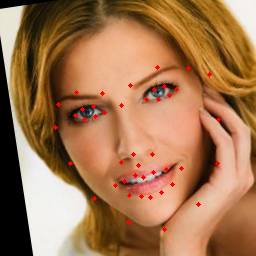

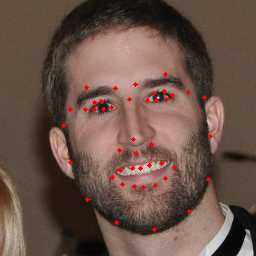

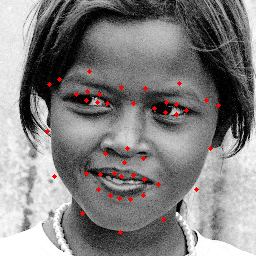

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
# Visualize the results on a few test images
for i in range(3):
    idx = np.random.randint(0, test_images.shape[0])
    pred_landmarks = plot_lankmarks(test_images[idx, ...], pred[idx, ...])
    cv2_imshow(pred_landmarks)
   

**Testing on Example Dataset**

In [20]:

model1 = tf.keras.models.load_model('/content/drive/MyDrive/files/model.h5')
example_data = np.load('/content/drive/MyDrive/projecttt/examples.npz', allow_pickle=True)
example_images = example_data['images']
example_images = example_images.astype('float32') / 255.0

pred = model1.predict(example_images, verbose=0)
pred = pred.astype(np.float32)

In [21]:
from google.colab.patches import cv2_imshow
import cv2

def visualise_pts(img, pts):
    img = (img * 255).astype(np.uint8)  # Convert the image back to its original range
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert the image to BGR format
    for point in pts:
        x, y = int(point[0]), int(point[1])
        cv2.circle(img, (x, y), 2, (0, 0, 255), -1)  # Draw a red circle at each point

    cv2_imshow(img)

In [22]:
def plot_lankmarks(image, landmarks):
    radius = int(image_h * 0.005)
    image = (image * 255).astype(np.uint8)  # Convert the image back to its original range
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    for i in range(0, len(landmarks), 2):
        x = landmarks[i] * image_w
        y = landmarks[i+1] * image_h
        cv2.circle(image, (int(x), int(y)), 2, (0, 0, 255), -1)
    return image

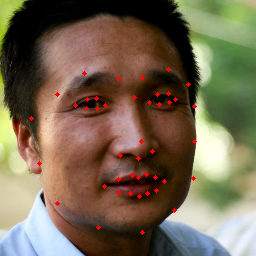

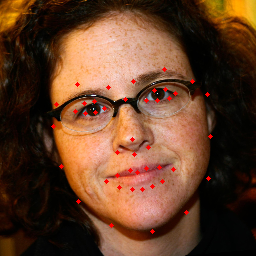

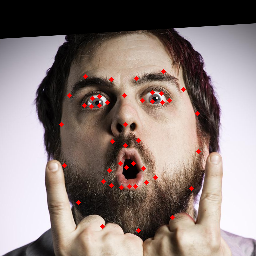

In [26]:
import cv2
from google.colab.patches import cv2_imshow
# Visualize the results on a few test images
for i in range(3):
    idx = np.random.randint(0, example_images.shape[0])
    pred_landmarks = plot_lankmarks(example_images[idx, ...], pred[idx, ...])
    cv2_imshow(pred_landmarks)
   

# **Apply MobileNetV2 for Training_Image_Subset**

In [ ]:
data = np.load('/content/drive/MyDrive/projecttt/training_images_subset.npz', allow_pickle=True)

# Extract the images and data points
images_subset = data['images']
pts_subset = data['points']

In [31]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

import numpy as np
import cv2
from glob import glob

import tensorflow as tf
from tensorflow.keras import layers as L
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, CSVLogger

global image2_h
global image2_w
global num_landmarks2

In [32]:
image2_h = 256
image2_w = 256
num_landmarks2 = 5
input_shape = (image2_h, image2_w, 3)
batch_size = 32
lr = 1e-3
num_epochs = 100

In [ ]:
def preprocess(x, y):
    def f(x, y):
        image, landmarks = read_image_lankmarks(x, y)
        return image, landmarks
    image, landmarks = tf.numpy_function(f, [x, y], [tf.float32, tf.float32])    
    image.set_shape([image2_h, image2_w, 3])
    landmarks.set_shape([num_landmarks2 * 2])
    return image, landmarks

In [ ]:
def build_model(input_shape, num_landmarks):
    inputs = L.Input(input_shape)

    backbone = MobileNetV2(include_top=False, weights="imagenet", input_tensor=inputs, alpha=0.5)
    backbone.trainable = True
    x = backbone.output
    x = L.GlobalAveragePooling2D()(x)
    x = L.Dropout(0.2)(x)
    outputs = L.Dense(num_landmarks*2, activation="sigmoid")(x)

    model = tf.keras.models.Model(inputs, outputs)
    return model

In [ ]:
def tf_dataset(x, y, batch=8):
    ds = tf.data.Dataset.from_tensor_slices((x, y))
    ds = ds.shuffle(buffer_size=5000).map(preprocess)
    ds = ds.batch(batch).prefetch(2)
    return ds

In [ ]:
def read_image_lankmarks(image,landmarks):
  h, w, _ = image.shape
  image = cv2.resize(image, (image2_w, image2_h))
  image = image/255.0
  image = image.astype(np.float32)
  landmarks1 = []
  for line in landmarks:
      arr_str = np.array2string(line)[1:-1]
      x , y = arr_str.split()
      x = float(x)/w
      y = float(y)/h
      landmarks1.append(x)
      landmarks1.append(y)

  landmarks1 = np.array(landmarks1, dtype=np.float32)
  return image, landmarks1


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(images_subset, pts_subset, test_size=0.1, random_state=42)


In [ ]:
train_ds = tf_dataset(X_train, y_train, batch=batch_size)
valid_ds = tf_dataset(X_val, y_val, batch=batch_size)

In [ ]:
model = build_model(input_shape, num_landmarks2)
model.compile(loss="binary_crossentropy", optimizer=tf.keras.optimizers.Adam(lr))


3201480/3201480 [==============================] - 0s 0us/step


In [ ]:
model_path = os.path.join("/content/drive/MyDrive/files/subset", "model.h5")
csv_path = os.path.join("/content/drive/MyDrive/files/subset", "data.csv")


In [ ]:
callbacks = [
        ModelCheckpoint(model_path, verbose=1, save_best_only=True, monitor='val_loss'),
        ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-7, verbose=1),
        CSVLogger(csv_path, append=True),
        EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=False)
    ]

model.fit(train_ds,
        validation_data=valid_ds,
        epochs=num_epochs,
        callbacks=callbacks
    )

Epoch 1/100
39/39 [==============================] - ETA: 0s - loss: 0.6722
Epoch 1: val_loss improved from inf to 1.13473, saving model to /content/drive/MyDrive/files/subset/model.h5
39/39 [==============================] - 57s 208ms/step - loss: 0.6722 - val_loss: 1.1347 - lr: 0.0010
Epoch 2/100
39/39 [==============================] - ETA: 0s - loss: 0.6532
Epoch 2: val_loss did not improve from 1.13473
39/39 [==============================] - 4s 105ms/step - loss: 0.6532 - val_loss: 1.2687 - lr: 0.0010
Epoch 3/100
39/39 [==============================] - ETA: 0s - loss: 0.6522
Epoch 3: val_loss did not improve from 1.13473
39/39 [==============================] - 5s 128ms/step - loss: 0.6522 - val_loss: 1.2739 - lr: 0.0010
Epoch 4/100
39/39 [==============================] - ETA: 0s - loss: 0.6517
Epoch 4: val_loss did not improve from 1.13473
39/39 [==============================] - 5s 117ms/step - loss: 0.6517 - val_loss: 1.2447 - lr: 0.0010
Epoch 5/100
39/39 [==================

In [28]:
model1 = tf.keras.models.load_model('/content/drive/MyDrive/files/subset/model.h5')
test_data = np.load('/content/drive/MyDrive/projecttt/test_images.npz', allow_pickle=True)
test_images = test_data['images']
test_images = test_images.astype('float32') / 255.0

pred = model1.predict(test_images, verbose=0)
pred = pred.astype(np.float32)


In [29]:
def plot_lankmarks(image, landmarks):
    radius = int(image2_h * 0.005)
    image = (image * 255).astype(np.uint8)  # Convert the image back to its original range
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    for i in range(0, len(landmarks), 2):
        x = landmarks[i] * image2_w
        y = landmarks[i+1] * image2_h
        cv2.circle(image, (int(x), int(y)), 2, (0, 0, 255), -1)
    return image

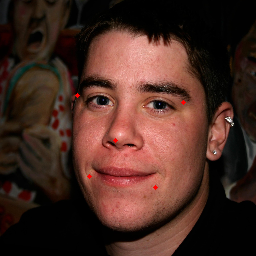

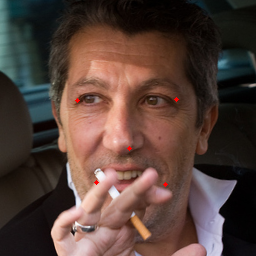

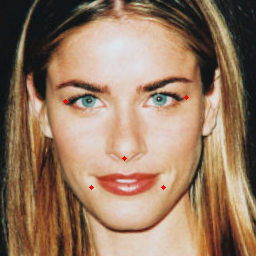

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
# Visualize the results on a few test images
for i in range(3):
    idx = np.random.randint(0, test_images.shape[0])
    pred_landmarks = plot_lankmarks(test_images[idx, ...], pred[idx, ...])
    cv2_imshow(pred_landmarks)
   

**Applying on Example Dataset**

In [27]:

model1 = tf.keras.models.load_model('/content/drive/MyDrive/files/subset/model.h5')
example_data = np.load('/content/drive/MyDrive/projecttt/examples.npz', allow_pickle=True)
example_images = example_data['images']
example_images = example_images.astype('float32') / 255.0

pred = model1.predict(example_images, verbose=0)
pred = pred.astype(np.float32)

In [33]:
from google.colab.patches import cv2_imshow
import cv2

def visualise_pts(img, pts):
    img = (img * 255).astype(np.uint8)  # Convert the image back to its original range
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert the image to BGR format
    for point in pts:
        x, y = int(point[0]), int(point[1])
        cv2.circle(img, (x, y), 2, (0, 0, 255), -1)  # Draw a red circle at each point

    cv2_imshow(img)

In [34]:
def plot_lankmarks(image, landmarks):
    radius = int(image2_h * 0.005)
    image = (image * 255).astype(np.uint8)  # Convert the image back to its original range
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    for i in range(0, len(landmarks), 2):
        x = landmarks[i] * image2_w
        y = landmarks[i+1] * image2_h
        cv2.circle(image, (int(x), int(y)), 2, (0, 0, 255), -1)
    return image

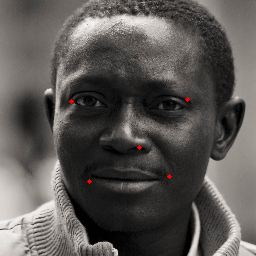

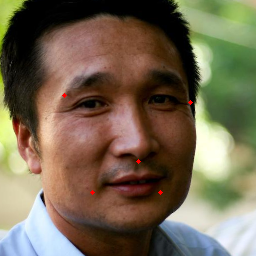

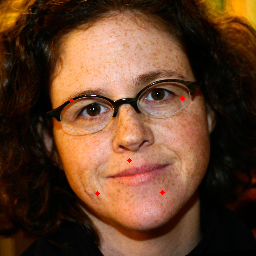

In [35]:
import cv2
from google.colab.patches import cv2_imshow
# Visualize the results on a few test images
for i in range(3):
    idx = np.random.randint(0, example_images.shape[0])
    pred_landmarks = plot_lankmarks(example_images[idx, ...], pred[idx, ...])
    cv2_imshow(pred_landmarks)
   

# **Mean Square Error for All Algorithms**

In [ ]:
array = []

In [ ]:
from sklearn.metrics import mean_squared_error

test_pts = model.predict(X_val)
mse = mean_squared_error(y_val, test_pts)
print("Mean squared error:", mse)
array.append(mse)

5/5 [==============================] - 0s 30ms/step
Mean squared error: 60.10605996470388


In [ ]:
from sklearn.metrics import mean_squared_error

test_pts = model.predict(X_val)
mse = mean_squared_error(y_val, test_pts)
print("Mean squared error:", mse)
array.append(mse)

5/5 [==============================] - 0s 18ms/step
Mean squared error: 47.20831448860481


In [ ]:
from sklearn.metrics import mean_squared_error

test_pts = model.predict(X_val)
mse = mean_squared_error(y_val, test_pts)
print("Mean squared error:", mse)
array.append(mse)

5/5 [==============================] - 0s 47ms/step
Mean squared error: 140.87525524023025


In [ ]:
from sklearn.metrics import mean_squared_error

test_pts = model.predict(X_val)
mse = mean_squared_error(y_val, test_pts)
print("Mean squared error:", mse)
array.append(mse)

5/5 [==============================] - 0s 46ms/step
Mean squared error: 95.92100643927795


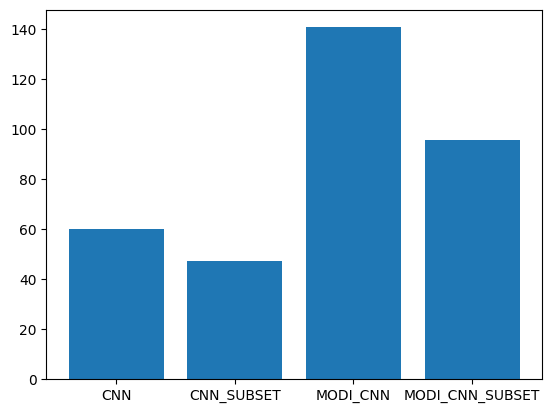

In [18]:
import matplotlib.pyplot as plt
import numpy as np

x = np.array(["CNN", "CNN_SUBSET", "MODI_CNN", "MODI_CNN_SUBSET"])
plt.bar(x,array)
plt.show()